# Langevin sampling results

Load one Langevin `*_samples.npz` archive and inspect maps, residuals, chain diagnostics, and sample variability.

In [25]:
from pathlib import Path
import json
import zipfile
import numpy as np
import matplotlib.pyplot as plt

PROJECT_ROOT = Path('/Users/tsouros/Desktop/Projects/STL-Dev')
LANGEVIN_DIR = PROJECT_ROOT / 'langevin'
RESULTS_DIR = LANGEVIN_DIR / 'results'
CIB_PATH = PROJECT_ROOT / 'data' / 'test' / 'cib.npy'

# Set this explicitly if you do not want the most recently modified archive.
RESULT_PATH = None
# RESULT_PATH = RESULTS_DIR / 'mock_data_ula_anchor_samples.npz'

if RESULT_PATH is None:
    candidates = sorted(RESULTS_DIR.glob('*_samples.npz'), key=lambda path: path.stat().st_mtime, reverse=True)
    if not candidates:
        raise FileNotFoundError(f'No *_samples.npz archives found in {RESULTS_DIR}')
    result = None
    for candidate in candidates:
        try:
            trial = np.load(candidate, allow_pickle=True)
            _ = trial.files
            if 'samples' not in trial.files and 'posterior_samples' not in trial.files:
                trial.close()
                raise ValueError('no samples array')
        except (OSError, ValueError, EOFError, zipfile.BadZipFile) as error:
            print(f'Skipping invalid/incomplete archive {candidate.name}: {error}')
            continue
        RESULT_PATH = candidate
        result = trial
        break
    if result is None:
        raise RuntimeError(f'No valid Langevin sample archive found in {RESULTS_DIR}')
else:
    result = np.load(RESULT_PATH, allow_pickle=True)

cib = np.asarray(np.load(CIB_PATH), dtype=float)
true_noise = cib[0] if cib.ndim == 3 else cib
if true_noise.ndim != 2:
    raise ValueError(f'Expected CIB shape (H,W) or (N,H,W), got {cib.shape}')
print('Loaded:', RESULT_PATH)
print('True noise:', CIB_PATH, 'index=0', true_noise.shape)
for key in result.files:
    value = result[key]
    print(f'{key:28s} shape={value.shape!s:18s} dtype={value.dtype}')

Loaded: /Users/tsouros/Desktop/Projects/STL-Dev/langevin/results/mock_data_ula_samples.npz
True noise: /Users/tsouros/Desktop/Projects/STL-Dev/data/test/cib.npy index=0 (256, 256)
observed_data                shape=(256, 256)         dtype=float64
samples                      shape=(100, 256, 256)    dtype=float64
posterior_mean               shape=(256, 256)         dtype=float64
posterior_std                shape=(256, 256)         dtype=float64
residuals                    shape=(100, 256, 256)    dtype=float64
total_energy                 shape=(20000,)           dtype=float64
likelihood_energy            shape=(20000,)           dtype=float64
prior_energy                 shape=(20000,)           dtype=float64
gradient_norm                shape=(20000,)           dtype=float64
gradient_rms                 shape=(20000,)           dtype=float64
rho                          shape=(20000,)           dtype=float64
elapsed_seconds              shape=(20000,)           dtype=float64
acti

In [26]:
def get_array(key, default=None):
    return np.asarray(result[key]) if key in result.files else default

observed = get_array('observed_data')
samples = get_array('samples')
if samples is None and 'posterior_samples' in result.files:
    samples = get_array('posterior_samples')
if observed is None or samples is None or samples.ndim != 3:
    raise ValueError('Archive must contain observed_data and a three-dimensional samples array')

if true_noise.shape != observed.shape:
    raise ValueError(f'True-noise shape {true_noise.shape} does not match observed shape {observed.shape}')
true_signal = observed - true_noise
posterior_mean = get_array('posterior_mean', samples.mean(axis=0))
posterior_std = get_array('posterior_std', samples.std(axis=0))
residuals = get_array('residuals', observed[None] - samples)
initial = get_array('initial_signal')
anchor = get_array('anchor_signal')
if anchor is not None and anchor.size == 0:
    anchor = None

print(f'n_samples={samples.shape[0]} image_shape={samples.shape[1:]}')
print(f'mean posterior pixel std={posterior_std.mean():.6g}')
if anchor is not None:
    rms = np.sqrt(np.mean((samples - anchor[None])**2, axis=(1, 2)))
    print(f'sample-to-anchor RMS: mean={rms.mean():.6g}, range=({rms.min():.6g}, {rms.max():.6g})')

n_samples=100 image_shape=(256, 256)
mean posterior pixel std=0.249355


## Signal maps on a common colour scale

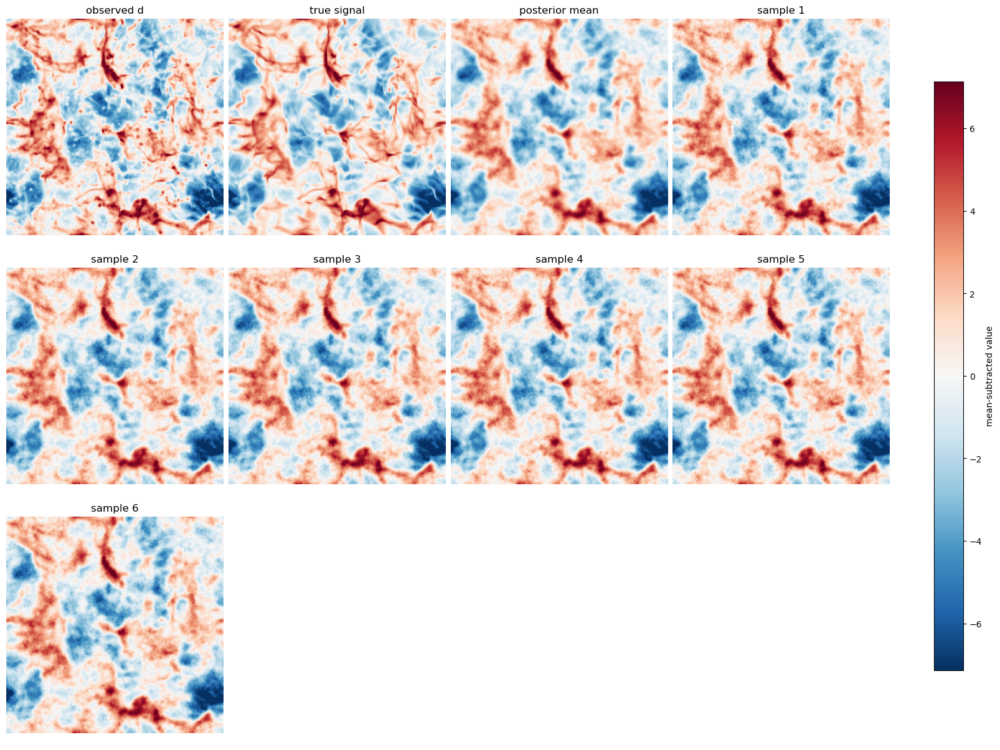

In [27]:
if true_signal.shape != observed.shape:
    raise ValueError(f'True signal shape {true_signal.shape} does not match observed shape {observed.shape}')
maps = [('observed d', observed), ('true signal', true_signal)]
if initial is not None:
    maps.append(('initial signal', initial))
if anchor is not None:
    maps.append(('anchor signal', anchor))
maps.append(('posterior mean', posterior_mean))
for i in range(min(6, samples.shape[0])):
    maps.append((f'sample {i + 1}', samples[i]))

centered = [(name, image - np.nanmean(image)) for name, image in maps]
scale = max(np.nanpercentile(np.abs(image), 99) for _, image in centered)
ncols = 4
nrows = int(np.ceil(len(centered) / ncols))
fig, axes = plt.subplots(nrows, ncols, figsize=(4*ncols, 4*nrows), constrained_layout=True)
axes = np.atleast_1d(axes).ravel()
for ax, (name, image) in zip(axes, centered):
    im = ax.imshow(image, origin='lower', cmap='RdBu_r', vmin=-scale, vmax=scale)
    ax.set_title(name)
    ax.axis('off')
for ax in axes[len(centered):]:
    ax.axis('off')
fig.colorbar(im, ax=axes[:len(centered)], shrink=0.8, label='mean-subtracted value')
plt.show()

## Residual CIB maps: $d-s$

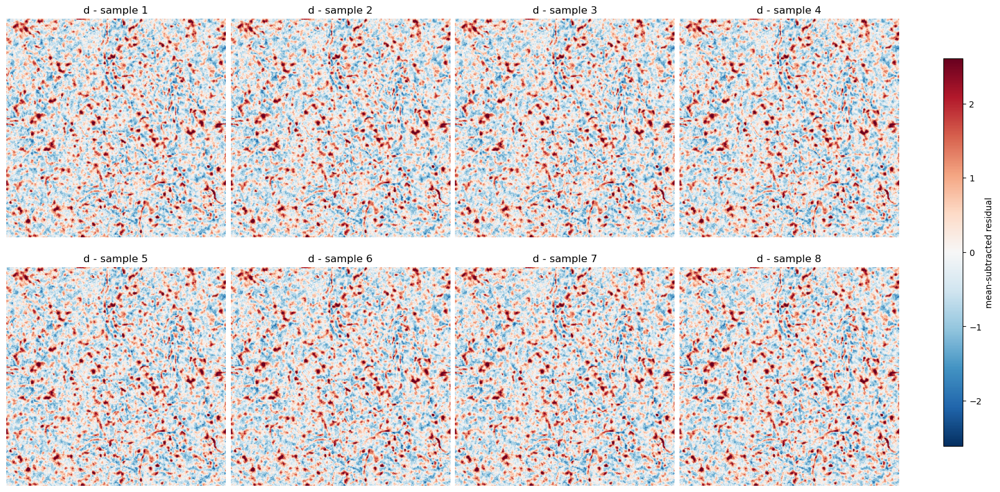

In [28]:
n_show = min(8, residuals.shape[0])
shown = residuals[:n_show] - residuals[:n_show].mean(axis=(1, 2), keepdims=True)
scale = np.nanpercentile(np.abs(shown), 99)
fig, axes = plt.subplots(2, 4, figsize=(16, 8), constrained_layout=True)
axes = axes.ravel()
for i, ax in enumerate(axes[:n_show]):
    im = ax.imshow(shown[i], origin='lower', cmap='RdBu_r', vmin=-scale, vmax=scale)
    ax.set_title(f'd - sample {i + 1}')
    ax.axis('off')
for ax in axes[n_show:]:
    ax.axis('off')
fig.colorbar(im, ax=axes[:n_show], shrink=0.8, label='mean-subtracted residual')
plt.show()

## Sample variability on its own colour scale

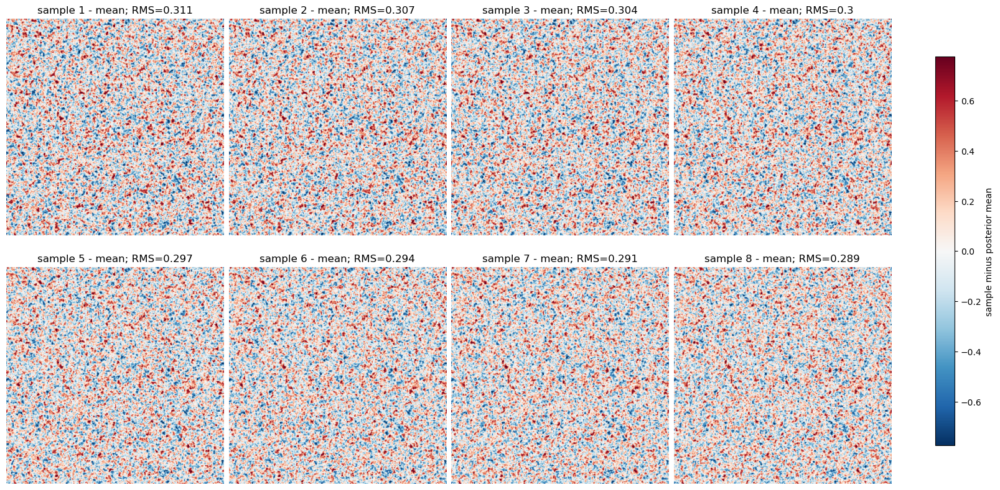

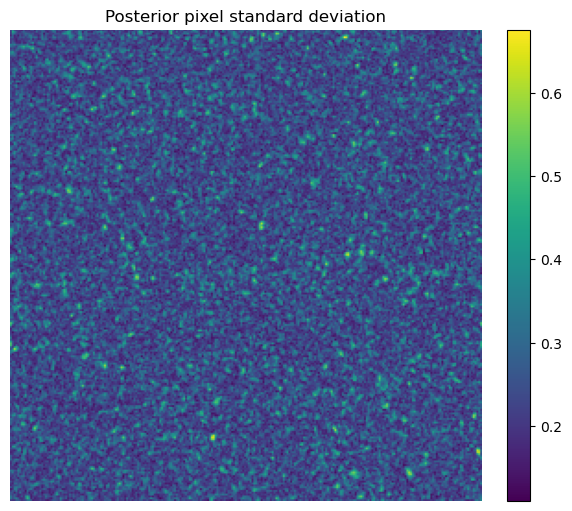

In [29]:
n_show = min(8, samples.shape[0])
deviations = samples[:n_show] - posterior_mean[None]
scale = np.nanpercentile(np.abs(deviations), 99)
fig, axes = plt.subplots(2, 4, figsize=(16, 8), constrained_layout=True)
axes = axes.ravel()
for i, ax in enumerate(axes[:n_show]):
    im = ax.imshow(deviations[i], origin='lower', cmap='RdBu_r', vmin=-scale, vmax=scale)
    rms = np.sqrt(np.mean(deviations[i]**2))
    ax.set_title(f'sample {i + 1} - mean; RMS={rms:.3g}')
    ax.axis('off')
for ax in axes[n_show:]:
    ax.axis('off')
fig.colorbar(im, ax=axes[:n_show], shrink=0.8, label='sample minus posterior mean')
plt.show()

fig, ax = plt.subplots(figsize=(6, 5), constrained_layout=True)
im = ax.imshow(posterior_std, origin='lower', cmap='viridis')
ax.set_title('Posterior pixel standard deviation')
ax.axis('off')
fig.colorbar(im, ax=ax)
plt.show()

## ULA chain diagnostics

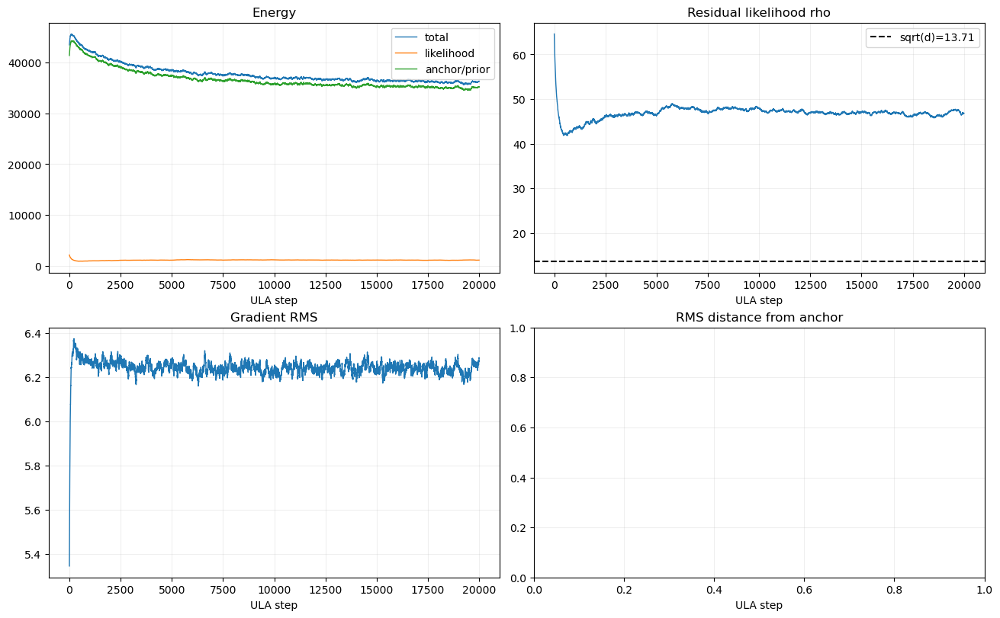

rho second half: mean=46.9440, std=0.4018, range=(45.8052, 48.0380)


In [30]:
total = get_array('total_energy')
like = get_array('likelihood_energy')
prior = get_array('prior_energy')
rho = get_array('rho')
grad_rms = get_array('gradient_rms')
anchor_rms = get_array('anchor_distance_rms')
active_mask = get_array('active_statistic_mask')
expected_rho = np.sqrt(np.count_nonzero(active_mask)) if active_mask is not None else None

fig, axes = plt.subplots(2, 2, figsize=(13, 8), constrained_layout=True)
if total is not None:
    axes[0, 0].plot(total, label='total', lw=1)
if like is not None:
    axes[0, 0].plot(like, label='likelihood', lw=1)
if prior is not None:
    axes[0, 0].plot(prior, label='anchor/prior', lw=1)
axes[0, 0].set_title('Energy')
axes[0, 0].legend()

if rho is not None:
    axes[0, 1].plot(rho, lw=1)
    if expected_rho is not None:
        axes[0, 1].axhline(expected_rho, color='k', ls='--', label=f'sqrt(d)={expected_rho:.2f}')
        axes[0, 1].legend()
axes[0, 1].set_title('Residual likelihood rho')

if grad_rms is not None:
    axes[1, 0].plot(grad_rms, lw=1)
axes[1, 0].set_title('Gradient RMS')

if anchor_rms is not None:
    axes[1, 1].plot(anchor_rms, lw=1)
axes[1, 1].set_title('RMS distance from anchor')
for ax in axes.ravel():
    ax.set_xlabel('ULA step')
    ax.grid(alpha=0.2)
plt.show()

if rho is not None:
    tail = rho[len(rho)//2:]
    print(f'rho second half: mean={tail.mean():.4f}, std={tail.std():.4f}, range=({tail.min():.4f}, {tail.max():.4f})')

## Separation between saved samples

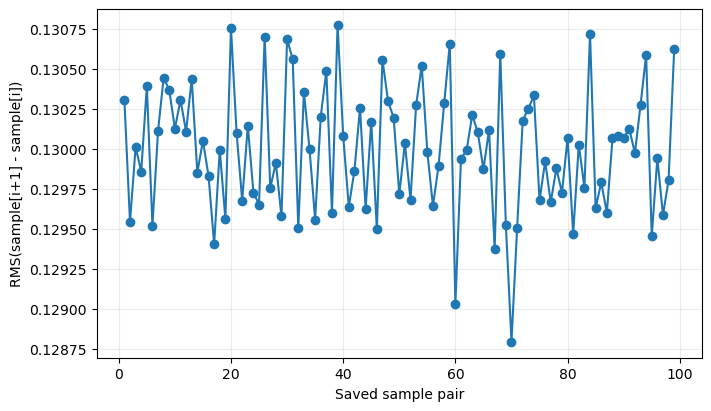

consecutive-sample RMS: mean=0.129991, range=(0.128796, 0.130771)


In [31]:
if samples.shape[0] >= 2:
    consecutive_rms = np.sqrt(np.mean(np.diff(samples, axis=0)**2, axis=(1, 2)))
    fig, ax = plt.subplots(figsize=(7, 4), constrained_layout=True)
    ax.plot(np.arange(1, samples.shape[0]), consecutive_rms, 'o-')
    ax.set_xlabel('Saved sample pair')
    ax.set_ylabel('RMS(sample[i+1] - sample[i])')
    ax.grid(alpha=0.25)
    plt.show()
    print(f'consecutive-sample RMS: mean={consecutive_rms.mean():.6g}, range=({consecutive_rms.min():.6g}, {consecutive_rms.max():.6g})')
else:
    print('At least two saved samples are required for this diagnostic.')